# Tutorial 5: Visium HD: Soybean Seed

 <div style="margin:0; line-height:1.2">

 Analyze soybean seed spatial transcriptomics data with SpacGPA.<br/>



 Data source: https://www.10xgenomics.com/datasets/visium-hd-three-prime-soybean  <br/>



 This is a soybean seed sample generated with Visium HD.<br/>

 <div>

In [1]:
# Import SpacGPA and other required packages.
import SpacGPA as sg
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import os
import warnings
warnings.filterwarnings("ignore", message=r".*Variable names are not unique.*")


In [2]:
# Set the working directory to your local path.
workdir = '..'
os.chdir(workdir)


### Part 1: Gene program analysis via SpacGPA ###

In [3]:
# For Visium HD data, we recommend using the binned outputs (e.g. 16μm binning here) for analysis.
# Before first-time use, construct the tissue_positions.csv from the tissue_positions.parquet file for easy reading.
# A demo for file conversion:
df_tissue_positions = pd.read_parquet("data/visium_HD/Soybean_Seed/binned_outputs/square_016um/spatial/tissue_positions.parquet")
df_tissue_positions.to_csv("data/visium_HD/Soybean_Seed/binned_outputs/square_016um/spatial/tissue_position.csv", index = False, header = None)
df_tissue_positions.to_csv("data/visium_HD/Soybean_Seed/binned_outputs/square_016um/spatial/tissue_positions_list.csv", index = False, header = None)


In [4]:
# Load spatial transcriptomics data.
adata = sc.read_visium("data/visium_HD/Soybean_Seed/binned_outputs/square_016um/",
                       count_file = "filtered_feature_bc_matrix.h5")
adata.var_names_make_unique()
adata.var_names = adata.var['gene_ids']
print(adata)


AnnData object with n_obs × n_vars = 131623 × 47095
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


In [5]:
# Preprocessing: library-size normalize and log1p-transform.
sc.pp.filter_cells(adata, min_genes = 1)
sc.pp.normalize_total(adata, target_sum = 1e4)
sc.pp.log1p(adata)
sc.pp.filter_cells(adata, min_genes = 100)
sc.pp.filter_genes(adata, min_cells = 50)
print(adata.X.shape)


(98592, 25774)


In [6]:
# Construct the co-expression network using SpacGPA (Gaussian graphical model).
ggm = sg.create_ggm(adata, project_name = "Soybean Seed")


Please Normalize The Expression Matrix Before Running!
Loading Data.

Running all calculations on GPU (if available).
Using single precision (float32) for all calculations.
Using chunk size of 5000 for efficient computation

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 16608 iterations.
Number of genes randomly selected in each iteration: 2000
Iteration: 16608/16608, Avg loop time: 0.0389 s, Elapsed time: 11.09 min, Estimated time left: 0.00 min.                  
All iterations completed.

Performing FDR control...
Randomly redistribute the expression distribution of input genes...

Calculate correlation between genes after redistribution...

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 16608 iterations.
Number of genes randomly selected i

In [7]:
# Show statistically significant co-expression gene pairs.
print(ggm.SigEdges.head(5))


                                  GeneA                                 GeneB  \
0  glyma.Wm82.gnm4.ann1.Glyma.01G005400  glyma.Wm82.gnm4.ann1.Glyma.01G004200   
1  glyma.Wm82.gnm4.ann1.Glyma.01G026200  glyma.Wm82.gnm4.ann1.Glyma.01G009200   
2  glyma.Wm82.gnm4.ann1.Glyma.01G036900  glyma.Wm82.gnm4.ann1.Glyma.01G017000   
3  glyma.Wm82.gnm4.ann1.Glyma.01G037400  glyma.Wm82.gnm4.ann1.Glyma.01G032000   
4  glyma.Wm82.gnm4.ann1.Glyma.01G044600  glyma.Wm82.gnm4.ann1.Glyma.01G006800   

       Pcor  SamplingTime         r  Cell_num_A  Cell_num_B  \
0  0.024494            86  0.046834        1721        1456   
1  0.025690           112  0.099143        1591         937   
2  0.020418            80  0.039377        4598        5550   
3  0.024970           105  0.034762         669         191   
4  0.037100           104  0.064017         228         113   

   Cell_num_coexpressed       Project  
0                   111  Soybean Seed  
1                   185  Soybean Seed  
2             

In [8]:
# Identify gene programs using the MCL-Hub algorithm (set inflation to 2).
ggm.find_modules(method = 'mcl-hub', inflation = 2)



Find modules using MCL-Hub...
Current Pcor: 0.02
Total significantly co-expressed gene pairs: 51275
Iteration: 33, Max change: 0.00000000 
Converged at iteration 33.

4 modules were removed due to their linear or radial topology structure out of 61 modules.


In [9]:
# Inspect the top 5 identified gene programs.
print(ggm.modules_summary.head(5))


  module_id  size  num_genes_degree_ge_2  \
0        M1   305                    230   
1        M2   296                    203   
2        M3   243                    183   
3        M4   240                    185   
4        M5   219                    182   

                                           all_genes  
0  glyma.Wm82.gnm4.ann1.Glyma.09G185500, glyma.Wm...  
1  glyma.Wm82.gnm4.ann1.Glyma.17G019300, glyma.Wm...  
2  glyma.Wm82.gnm4.ann1.Glyma.18G011600, glyma.Wm...  
3  glyma.Wm82.gnm4.ann1.Glyma.15G274300, glyma.Wm...  
4  glyma.Wm82.gnm4.ann1.Glyma.14G052000, glyma.Wm...  


In [10]:
# Print a summary of the GGM analysis.
print(ggm)


View of ggm object: Soybean Seed
MetaInfo:
  Gene Number: 25774
  Sample Number: 98592
  Pcor Threshold: 0.02

Results:
  SigEdges: DataFrame with 51275 significant gene pairs
  modules: 57 modules with 3720 genes
  modules_summary: DataFrame with 57 rows
  FDR: Exists



In [11]:
# Save the GGM object to HDF5 for later reuse.
sg.save_ggm(ggm, "data/Soybean_Seed_HD.ggm.h5")


### Part 2: Spot annotation based on program expression ###

In [12]:
# Compute per-spot expression scores of each gene program.
sg.calculate_module_expression(adata, ggm)



Calculating module expression using top 30 genes...

Calculating gene weights based on degree...
Storing module information in adata.uns['module_info']...

Assigning colors to 57 modules...

Total 57 modules' average expression calculated and stored in adata.obs and adata.obsm


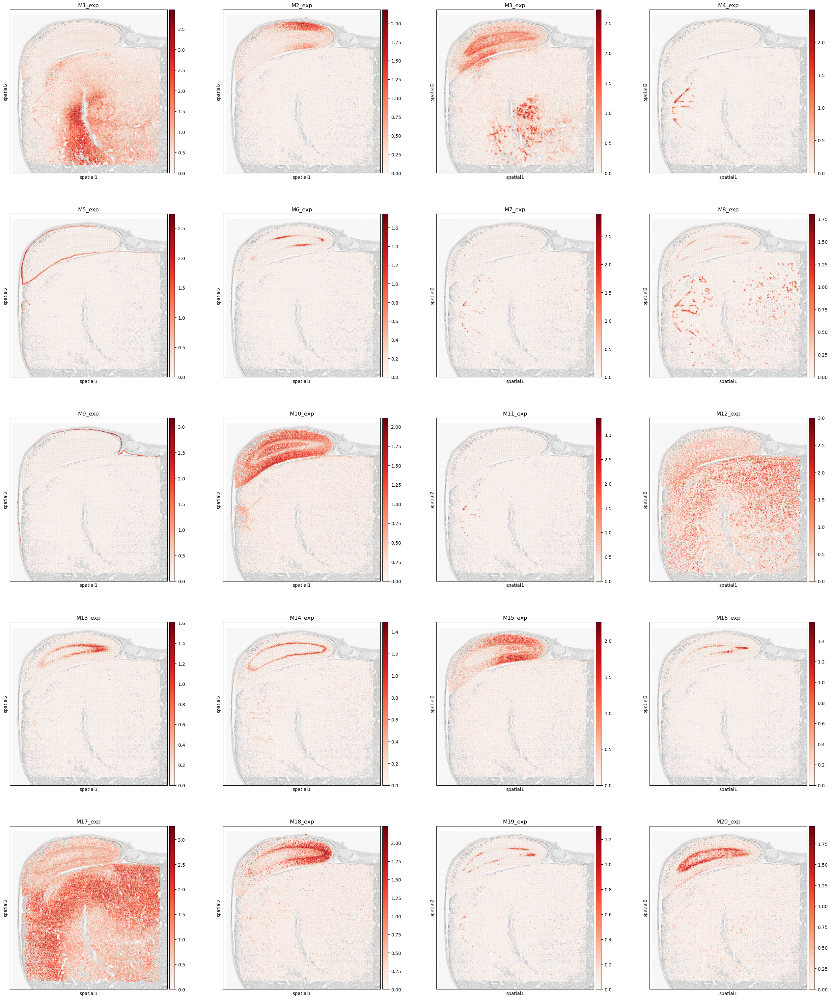

In [13]:
# Visualize the spatial distribution of the top 20 program-expression scores.
plt.rcParams["figure.figsize"] = (7, 7)
program_list = ggm.modules_summary['module_id'] + '_exp'
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = program_list[:20], cmap = 'Reds', ncols = 4)


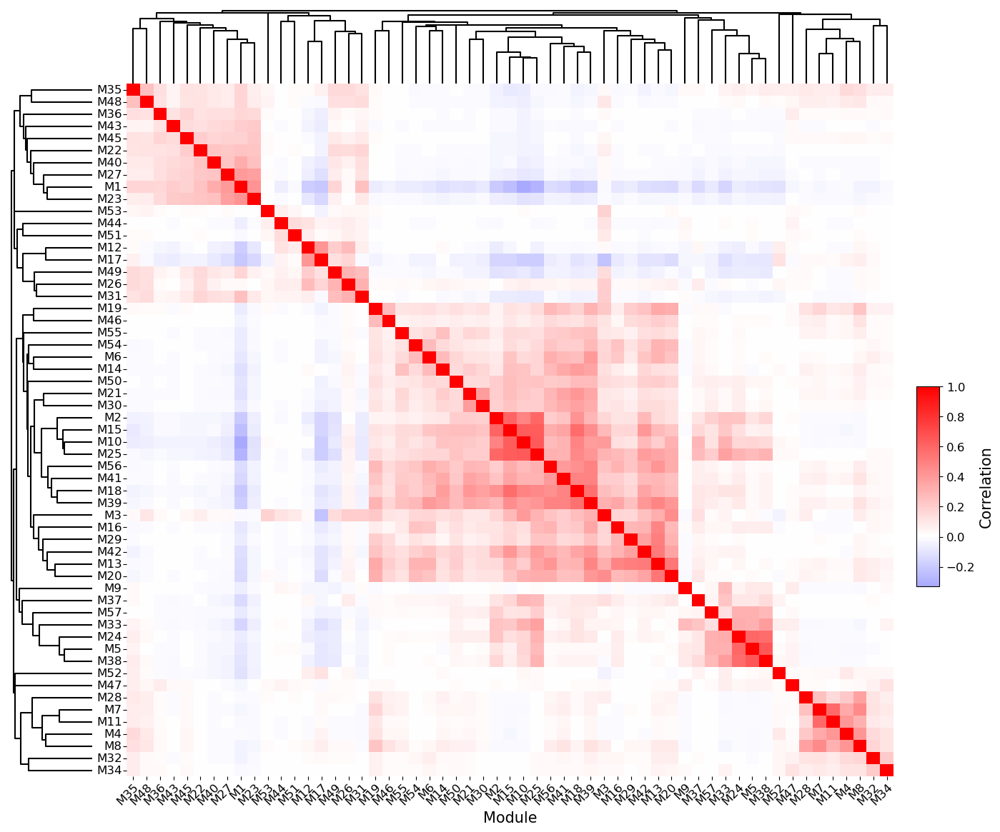

In [14]:
# Compute pairwise program similarity and plot the correlation heatmap with dendrograms.
sg.module_similarity_plot(adata, ggm_key = 'ggm', corr_method = 'pearson', heatmap_metric = 'correlation', 
                          fig_height = 14, fig_width = 16, dendrogram_height = 0.1, dendrogram_space = 0.08, return_summary = False)


In [15]:
# Assign spot-level annotations via Gaussian Mixture Models (GMMs) based on program expression.
sg.calculate_gmm_annotations(adata, ggm_key = 'ggm')


M1 processed successfully, annotated cells: 8820
M2 processed successfully, annotated cells: 3847
M3 processed successfully, annotated cells: 11793
M4 processed successfully, annotated cells: 628
M5 processed successfully, annotated cells: 1913
M6 processed successfully, annotated cells: 1007
M7 processed successfully, annotated cells: 562
M8 processed successfully, annotated cells: 5553
M9 processed successfully, annotated cells: 612
M10 processed successfully, annotated cells: 14132
M11 processed successfully, annotated cells: 420
M12 processed successfully, annotated cells: 20827
M13 processed successfully, annotated cells: 1544
M14 processed successfully, annotated cells: 2196
M15 processed successfully, annotated cells: 6694
M16 processed successfully, annotated cells: 484
M17 processed successfully, annotated cells: 4220
M18 processed successfully, annotated cells: 5787
M19 processed successfully, annotated cells: 996
M20 processed successfully, annotated cells: 3604
M21 processe

In [16]:
# Optionally smooth the annotations using spatial k-NN (on the 'spatial' embedding).
sg.smooth_annotations(adata, ggm_key = 'ggm', embedding_key = 'spatial', k_neighbors = 24)


M1 processed. remain cells: 10351
M2 processed. remain cells: 4282
M3 processed. remain cells: 14145
M4 processed. remain cells: 695
M5 processed. remain cells: 2242
M6 processed. remain cells: 987
M7 processed. remain cells: 499
M8 processed. remain cells: 5456
M9 processed. remain cells: 605
M10 processed. remain cells: 16929
M11 processed. remain cells: 390
M12 processed. remain cells: 24084
M13 processed. remain cells: 1758
M14 processed. remain cells: 1990
M15 processed. remain cells: 7879
M16 processed. remain cells: 508
M17 processed. remain cells: 3871
M18 processed. remain cells: 6347
M19 processed. remain cells: 861
M20 processed. remain cells: 3888
M21 processed. remain cells: 754
M22 processed. remain cells: 446
M23 processed. remain cells: 9069
M24 processed. remain cells: 2456
M25 processed. remain cells: 16936
M26 processed. remain cells: 11428
M27 processed. remain cells: 1311
M28 processed. remain cells: 1481
M29 processed. remain cells: 675
M30 processed. remain cells

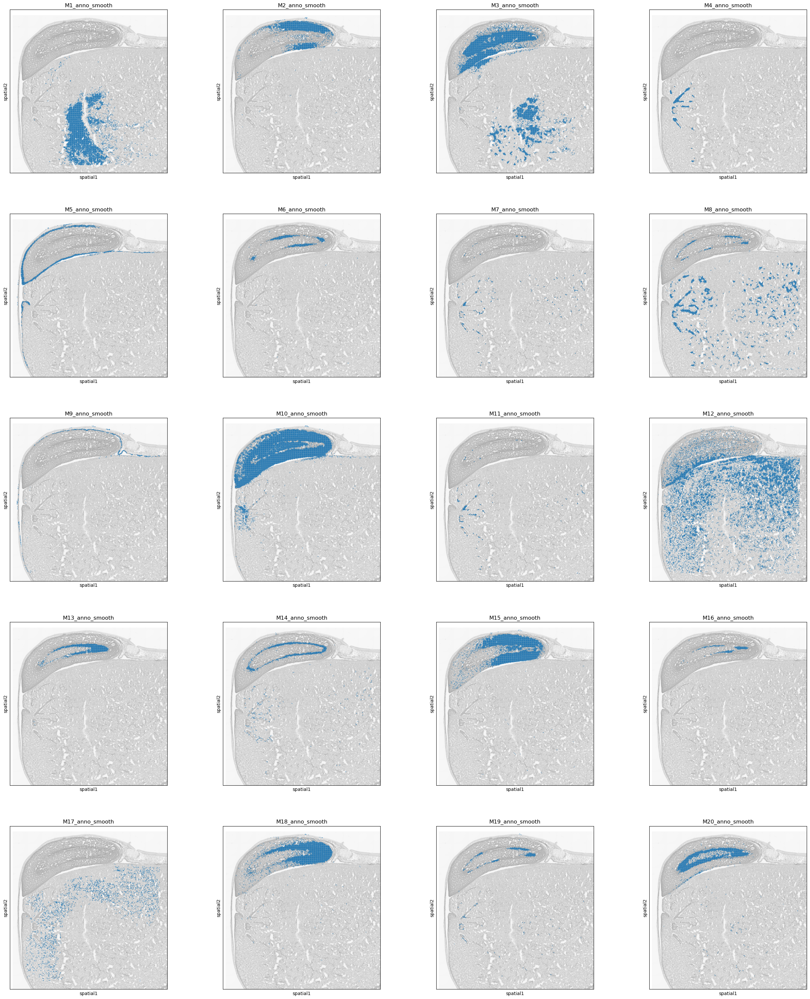

In [17]:
# Display smoothed annotations for top 20 programs.
# If smoothing is skipped, use 'M1_anno' … 'M20_anno' instead.
plt.rcParams["figure.figsize"] = (7, 7)
program_list = ggm.modules_summary['module_id'] + '_anno_smooth'
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = program_list[:20], legend_loc = None, ncols = 4)
# Where the blue nodes indicate the spots annotated by the program, and gray nodes are unassigned.


In [18]:
# Integrate multiple program-derived annotations into a single label set via sg.integrate_annotations.
sg.integrate_annotations(adata, ggm_key = 'ggm', result_anno = 'ggm_annotation', neighbor_similarity_ratio = 0.6)
# Here we integrate all programs as an example. You can specify a subset of programs via the 'modules_used' parameter.



Calculating 24 nearest neighbors for each cell based on spatial embedding...


50345 of total 98592 cells have multiple annotations. Among them, 
    12150 cells are resolved by neighbors.
    38195 cells are resolved by expression score.

Integrated annotation stored in adata.obs['ggm_annotation'].



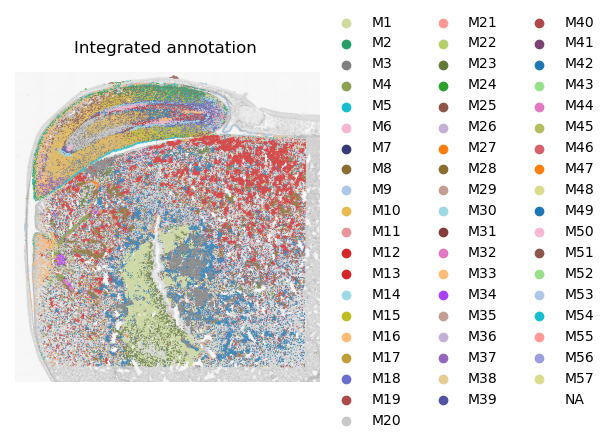

In [19]:
# Visualize the integrated annotation.
plt.rcParams["figure.figsize"] = (4, 6)
sc.pl.spatial(adata, size = 1.2, alpha_img = 0.5, bw = True, color = ['ggm_annotation'], palette = adata.uns['module_colors'],
              frameon = False, title = 'Integrated annotation')
